In [1]:
import numpy as np
import pandas as pd
from scipy.stats._continuous_distns import norm
import pickle

import matplotlib.pyplot as plt
# from matplotlib.lines import Line2D
from pathlib import Path
import netCDF4 as nc
import xarray as xr
import importlib
import src.mstmeclass as mc
import src.stme as stme
from scipy.spatial import KDTree


In [2]:
region = "caribbean"
rf = 'none'
# rf = 'h-east'
# rf = 'none'
depth = -100

match region:
    case "guadeloupe":
        dir_data = "./ww3_meteo"
        dir_bathy = "./Bathy.nc"
        min_lon = -62.00
        min_lat = 15.80
        max_lon = -60.80
        max_lat = 16.60
        dir_tracks = "./tracks"
        occur_freq = 44 / (2021 - 1971 + 1)
    # the cyclones were selected as passing at distance of 200km from Guadeloupe.
    # According to IBTrACS, there were 44 storms of class 0~5 during 1971-2021
    case "caribbean":
        dir_data = "./ww3_meteo_slim"
        dir_bathy = "./Bathy.nc"
        min_lon = -65.00
        min_lat = 12.00
        max_lon = -58.00
        max_lat = 18.00
        dir_tracks = "./tracks"
        occur_freq = 44 / (2021 - 1971 + 1)
ds_path = Path(f"./ds_filtered_{region}.txt")
ds_track_path = Path(f"./ds_track_{region}.txt")

# get stm from previous result
with open(Path(f'./output/{region}/GP{80}%_CM{80}%/{10}subsamples_{rf}/cluster_pickle.txt'),'rb') as f:
    cluster = pickle.load(f)
stm = cluster.stm
num_events = cluster.num_events

# with open('exp_series')
# exp_series = []
j = 0
for i,fp in enumerate(Path(dir_data).glob("*.nc")):
    if cluster.mask[i]:
        ds = xr.open_dataset(fp)
        if i==0: 
            print(ds)
        _exp = []
        for vi,key in enumerate(['hs','UV_10m']):
            _exp.append(ds[[key]]/stm[vi,j].data)
        _ds = xr.combine_by_coords(_exp)
        _ds.to_netcdf(f'./exp_series/{i:03d}.nc')
        print(j)
        j+=1



var_name    = ["$H_s$", "$U$"]
var_name_g  = ['$\hat H_s$', '$\hat U$']
unit        = ['[m]','[m/s]']


<xarray.Dataset>
Dimensions:    (time: 97, node: 86434)
Coordinates:
  * time       (time) datetime64[ns] 2000-06-01 ... 2000-06-03
    latitude   (node) float32 ...
    longitude  (node) float32 ...
Dimensions without coordinates: node
Data variables:
    hs         (time, node) float32 ...
    tp         (time, node) float32 ...
    UV_10m     (time, node) float32 ...
Attributes:
    title:        WW3
    institution:  WW3 2 UGRID (BRGM)
    source:       WW3 - Projet Carib-Coast
    references:   WW3 WIKI
    Conventions:  CF-1.6, UGRID-1.0
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139


In [95]:
exp_series = []
for i,fp in enumerate(Path(dir_data).glob("*.nc")):
  ds = xr.open_dataset(fp)
  if i==0: 
    print(ds)
  _exp = []
  for vi,key in enumerate(['hs','UV_10m']):
    _exp.append(ds[[key]]/stm[vi,i].data)
  _ds = xr.combine_by_coords(_exp)
  exp_series.append(_ds)
  print(i)

<xarray.Dataset>
Dimensions:    (time: 97, node: 86434)
Coordinates:
  * time       (time) datetime64[ns] 2000-06-01 ... 2000-06-03
    latitude   (node) float32 ...
    longitude  (node) float32 ...
Dimensions without coordinates: node
Data variables:
    hs         (time, node) float32 ...
    tp         (time, node) float32 ...
    UV_10m     (time, node) float32 ...
Attributes:
    title:        WW3
    institution:  WW3 2 UGRID (BRGM)
    source:       WW3 - Projet Carib-Coast
    references:   WW3 WIKI
    Conventions:  CF-1.6, UGRID-1.0
0
1
2
3
4
5
6
7


In [93]:
exp_series[0]['hs']

<xarray.DataArray 'hs' (time: 97, node: 86434)>
array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.03894081, 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.04672897, 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.13239874, 0.0576324 ,
        0.03738318],
       [0.        , 0.        , 0.        , ..., 0.13239874, 0.06230529,
        0.04049844],
       [0.        , 0.        , 0.        , ..., 0.13239874, 0.06697819,
        0.04361371]], dtype=float32)
Coordinates:
  * time       (time) datetime64[ns] 2000-06-01 ... 2000-06-03
    latitude   (node) float32 22.1 21.7 15.94 8.371 ... 14.8 18.52 17.89 17.84
    longitude  (node) float32 -77.81 -84.8 -84.8 -59.81 ... -62.95 -76.02 -76.05
Dimensions without coordinates: node

Text(0, 0.5, '$U_{10}$')

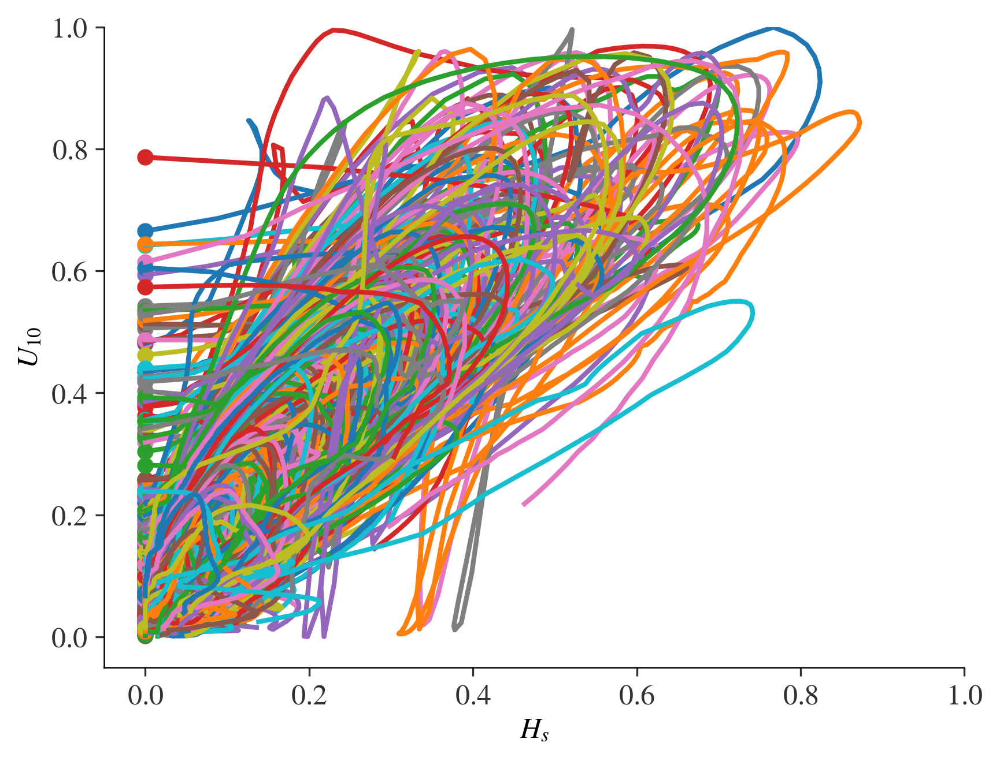

In [73]:
fig,ax=plt.subplots()
for i in range(num_events):
  ax.scatter(exp_series[i]['hs'][0,10],exp_series[i]['UV_10m'][0,10])
  ax.plot(exp_series[i]['hs'][:,10],exp_series[i]['UV_10m'][:,10])

ax.set_xlim(-0.05,1)
ax.set_ylim(-0.05,1)
ax.set_xlabel('$H_s$')
ax.set_ylabel('$U_{10}$')

IndexError: list index out of range

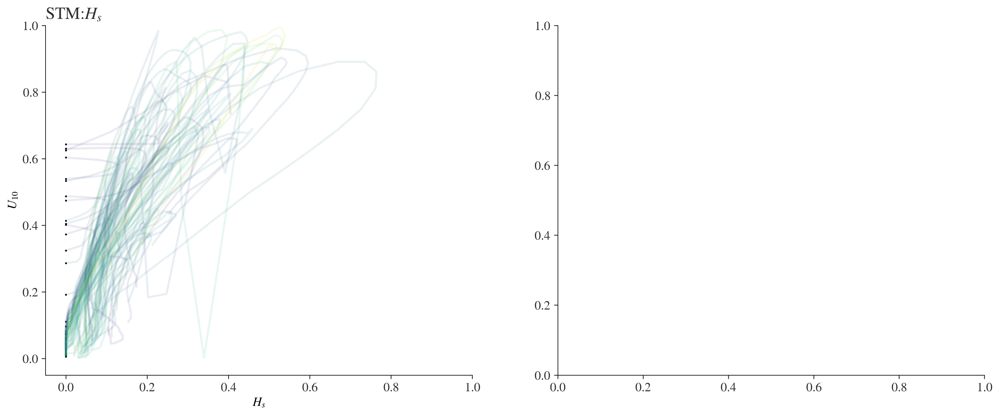

In [94]:
fig, ax = plt.subplots(
    1,
    2,
    figsize=(8 * 2, 6),
    facecolor="white",
  )
cmap = plt.get_cmap("viridis", 100)

for vi in range(2):
  _ax = ax[vi]
  _ax.set_title(f'STM:{var_name[vi]}')
  _ax.set_xlim(-0.05,1)
  _ax.set_ylim(-0.05,1)
  _ax.set_xlabel('$H_s$')
  _ax.set_ylabel('$U_{10}$')
  stm_max = stm[vi].max().data
  for i in range(num_events):
    _ax.scatter(exp_series[i]['hs'][0,5735],exp_series[i]['UV_10m'][0,5735],s=1,color='black')
    _ax.plot(exp_series[i]['hs'][:,5735],exp_series[i]['UV_10m'][:,5735],alpha=0.1,c=cmap(stm[vi,i]/stm_max))


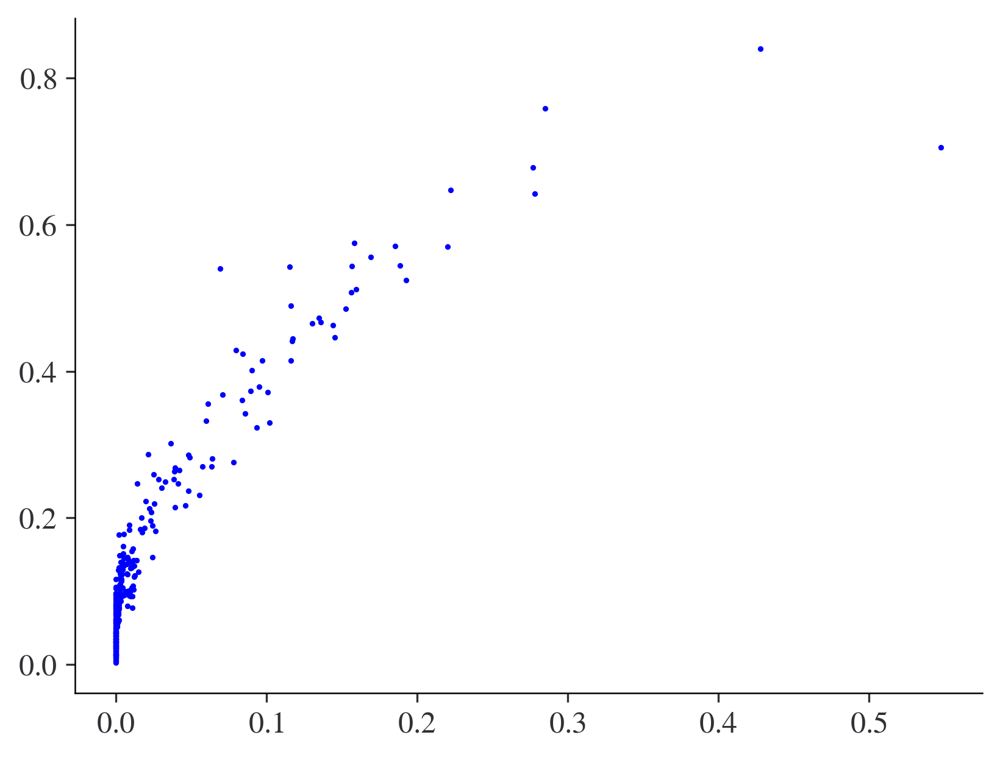

In [60]:
pos = 10
t=5
for i in range(num_events):
  plt.scatter(exp_series[i]['hs'][t,pos], exp_series[i]['UV_10m'][t,pos], color = 'blue', s=2)
  # plt.plot(exp[i][0,:,pos], exp[i][1,:,pos], color = 'blue', alpha = 0.1)


In [61]:
from scipy.spatial import KDTree


In [63]:
tree = KDTree(cluster.latlon)
_, pos_list = tree.query(
    [[16.150 - i * 0.05, -61.493] for i in range(4)]
)

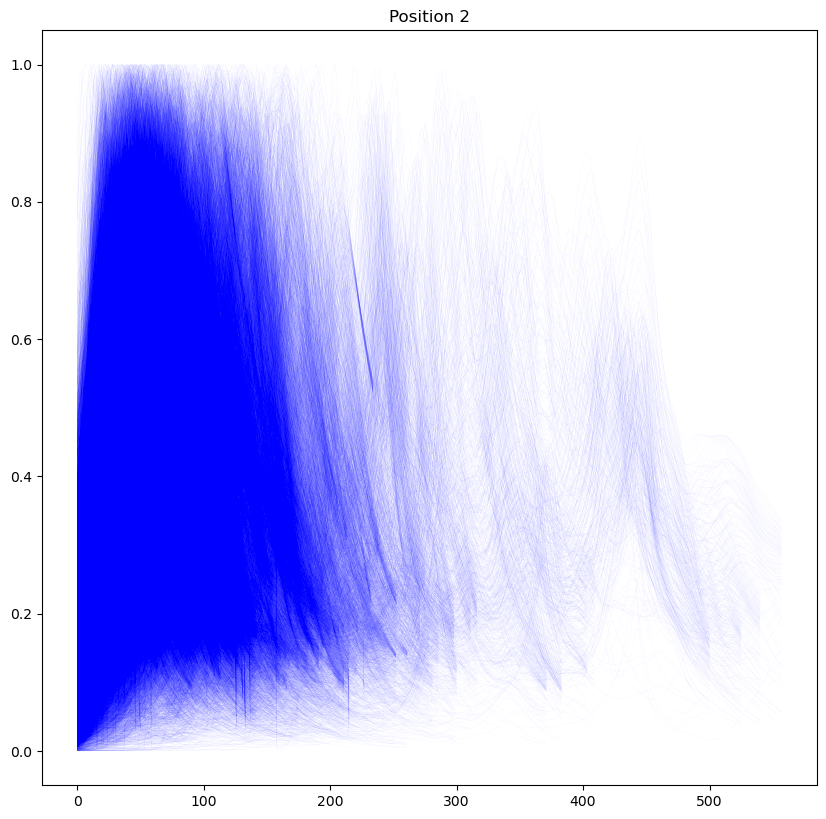

In [8]:
fig,ax=plt.subplots(figsize=(10,10),dpi=100,facecolor='white')
for pos in pos_list:
  
  for i in range(num_events):
  # i=2
    ax.plot(exp[i][0,:,pos], color = 'blue', lw=0.1, alpha=0.1)
    # ax.plot(exp[i][0,0,pos], exp[i][1,0,pos], color = 'black',s=0.5)
    # ax.scatter(exp[i][0,-1,pos], exp[i][1,-1,pos], color = 'red',s=0.5)
  # ax.set_xlim(0,1)
  # ax.set_ylim(0,1)
  # ax.set_aspect('equal')
  # ax.set_xlabel('$H_s$ Exposure')
  # ax.set_ylabel('$U_{10}$ Exposure')
  ax.set_title(f'Position {pos}')

Text(0.5, 1.0, 'Position 0')

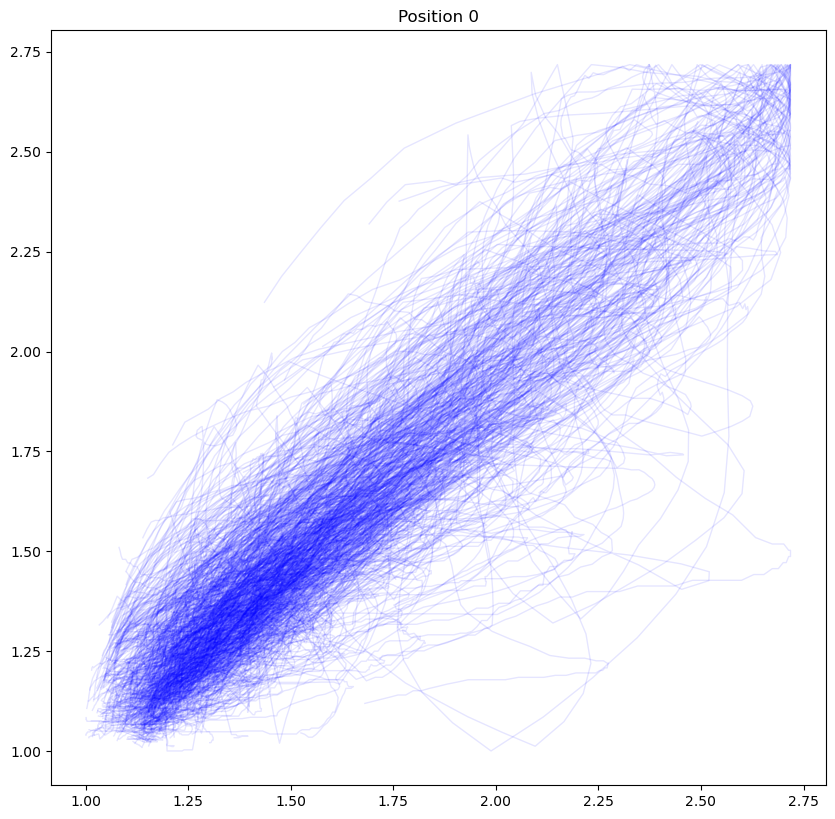

In [182]:
fig,ax=plt.subplots(figsize=(10,10),dpi=100,facecolor='white')

pos = 0  
for i in range(num_events):
  # if i!=5: continue
  ax.plot(np.exp(exp[i][0,:,pos]),np.exp(exp[i][1,:,pos]), color = 'blue', lw=1, alpha=0.1)
  # ax.plot(exp[i][0,:,pos], color = 'blue', lw=1, alpha=1)
  # ax.plot(exp[i][1,:,pos], color = 'red' , lw=1, alpha=1)
ax.set_title(f'Position {pos}')

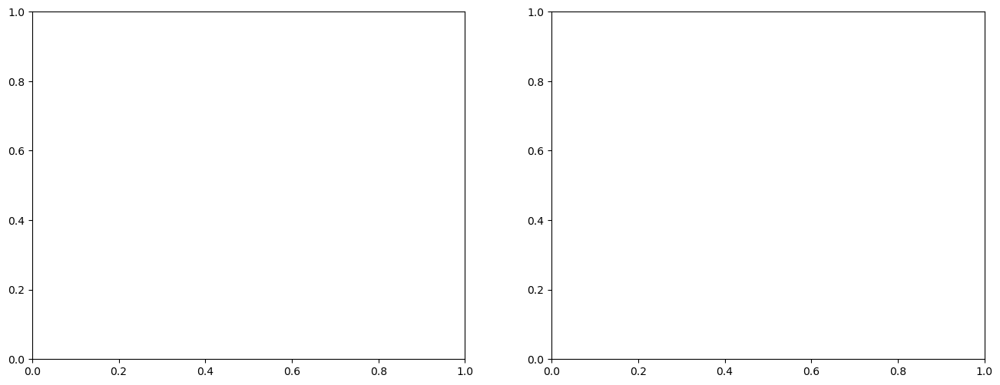

In [30]:
pos = 0
_e_peak = [[],[]]
_x_peak = [[],[]]
_idx = [[],[]]
_max = [[],[]]
_len = [[],[]]
_x = [[],[]]
# fig,ax=plt.subplots(1,2,figsize=(16,6),dpi=100,facecolor='white')

for vi in range(num_vars):
  for ei in range(num_events):
    _max[vi].append(exp[ei][vi,:,pos].max())
    _arg = exp[ei][vi,:,pos].argmax()
    _idx[vi].append(_arg)
    _x[vi].append(np.arange(exp[ei][vi,:,pos].shape[0]))
    _len[vi].append(min(20,min(_arg, len(exp[ei][vi,:,pos]))))
    _x_peak[vi].append(_x[vi][ei][_idx[vi][ei]-_len[vi][ei]:_idx[vi][ei]+_len[vi][ei]]-_idx[vi][ei])
    _e_peak[vi].append(exp[ei][vi,_idx[vi][ei]-_len[vi][ei]:_idx[vi][ei]+_len[vi][ei],pos])



# for vi in range(num_vars):
#   for ei in range(num_events):
#     ax[vi].plot(_x_peak,_e_peak/_max[vi][ei], color = 'blue', lw=0.1, alpha=0.3)

In [7]:
def gauss(x, H, sigma):
    return 1+(1-H)*(np.exp(-(x) ** 2 / (2 * sigma ** 2)))

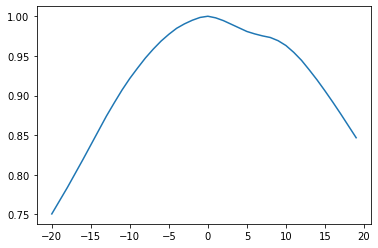

In [8]:
from scipy.optimize import curve_fit

popt = [[],[]]
pcov = [[],[]]
for vi in range(num_vars):
  for ei in range(num_events):
    _xx = _x[vi][ei][_idx[vi][ei]-_len[vi][ei]:_idx[vi][ei]+_len[vi][ei]] - _idx[vi][ei]
    _yy = exp[ei][vi,_idx[vi][ei]-_len[vi][ei]:_idx[vi][ei]+_len[vi][ei],pos]/_max[vi][ei]
    if len(_xx)>0 and len(_yy)>0:
      _popt, _pcov = curve_fit(gauss, _xx, _yy,bounds=([0,0],[1,100]), maxfev=1000)
    if ei==0 and vi==0:
      plt.plot(_xx,_yy)
    popt[vi].append(_popt)
    pcov[vi].append(_pcov)

In [9]:
popt = np.squeeze(np.array(popt))

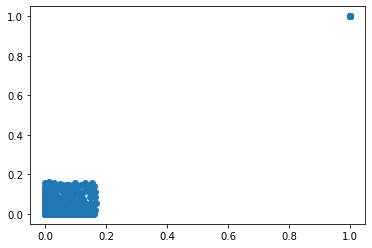

In [166]:
plt.scatter(popt[0],popt[1])

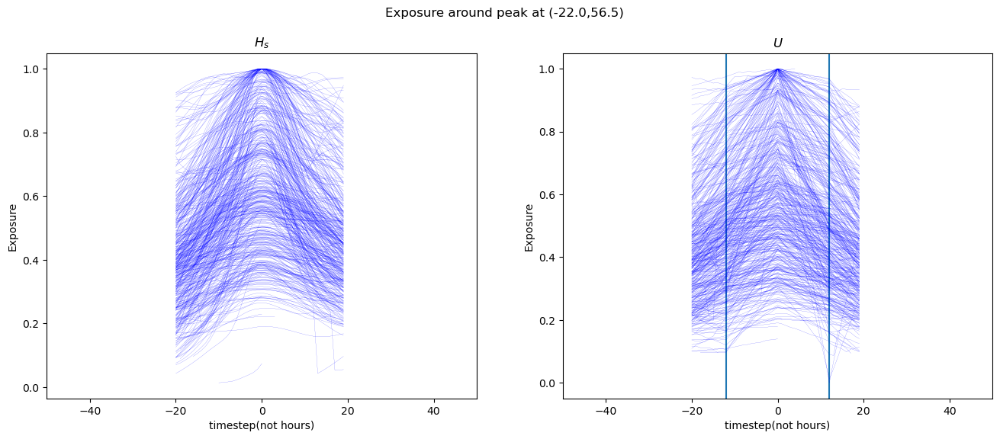

In [10]:
fig,ax=plt.subplots(1,2,figsize=(16,6),dpi=100,facecolor='white')
fig.suptitle(f'Exposure around peak at ({latlon[pos,0]},{latlon[pos,1]})')
ax[1].axvline(-12)
ax[1].axvline(12)
for vi in range(num_vars):
  ax[vi].set_xlim(-50,50)
  ax[vi].set_title(f'{var_name[vi]}')
  ax[vi].set_xlabel('timestep(not hours)')
  ax[vi].set_ylabel('Exposure')
  centers = np.linspace(-50,50,200)
  for ei in range(num_events):
    # ax[vi].plot(centers,gauss(centers,*popt[vi,ei]), color = 'orange', lw=0.1, alpha=1)
    ax[vi].plot(_x[vi][ei][_idx[vi][ei]-_len[vi][ei]:_idx[vi][ei]+_len[vi][ei]]-_idx[vi][ei],exp[ei][vi,_idx[vi][ei]-_len[vi][ei]:_idx[vi][ei]+_len[vi][ei],pos], color = 'blue', lw=0.1, alpha=1)

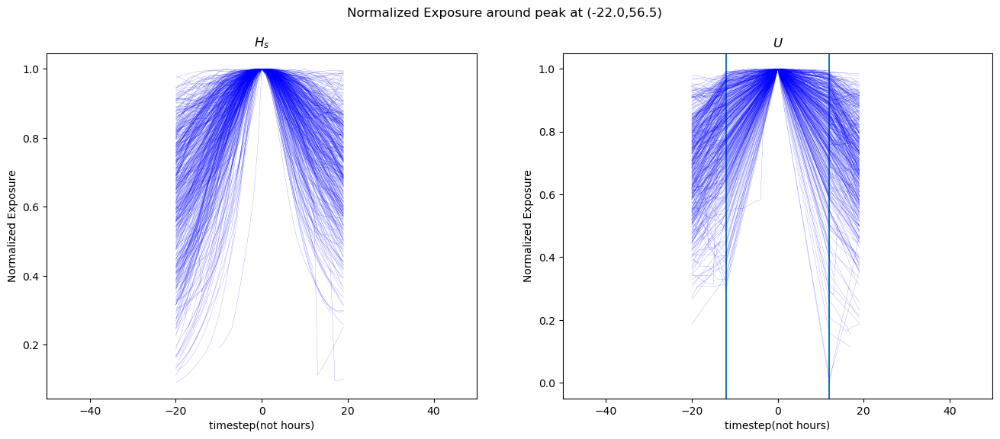

In [11]:
fig,ax=plt.subplots(1,2,figsize=(16,6),dpi=100,facecolor='white')
fig.suptitle(f'Normalized Exposure around peak at ({latlon[pos,0]},{latlon[pos,1]})')

ax[1].axvline(-12)
ax[1].axvline(12)
for vi in range(num_vars):
  ax[vi].set_xlim(-50,50)
  ax[vi].set_title(f'{var_name[vi]}')
  ax[vi].set_xlabel('timestep(not hours)')
  ax[vi].set_ylabel('Normalized Exposure')
  centers = np.linspace(-50,50,200)
  for ei in range(num_events):
    # ax[vi].plot(centers,gauss(centers,*popt[vi,ei]), color = 'orange', lw=0.1, alpha=1)
    ax[vi].plot(_x[vi][ei][_idx[vi][ei]-_len[vi][ei]:_idx[vi][ei]+_len[vi][ei]]-_idx[vi][ei],exp[ei][vi,_idx[vi][ei]-_len[vi][ei]:_idx[vi][ei]+_len[vi][ei],pos]/_max[vi][ei], color = 'blue', lw=0.1, alpha=1)

0.13417190775681342
1.0
0.4171907756813417
1.0
0.6813417190775681
2.0
1.471698113207547
2.0
2.3060796645702304
2.0
-0.014675052410901468
1.0
-0.570230607966457
1.0
0.6058700209643606
2.0
-0.6184486373165619
1.0
-0.6645702306079665
1.0
0.03563941299790356
1.0
0.689727463312369
1.0
1.530398322851153
2.0
1.480083857442348
2.0
3.3668763102725365
2.0
1.1320754716981132
1.0
0.16981132075471697
1.0
0.10272536687631027
1.0
-0.04612159329140461
1.0
-1.1425576519916143
1.0
1.0272536687631026
1.0


C:\Users\ksksn\AppData\Local\Temp/ipykernel_7324/130970004.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax=plt.subplots(figsize=(8,6),dpi=100,facecolor='white')


1.3962264150943395
2.0
1.4150943396226414
2.0
2.769392033542977
2.0
3.819706498951782
2.0
3.3752620545073375
2.0
-0.19916142557651992
1.0
-0.1761006289308176
1.0
-0.350104821802935
1.0
0.23270440251572327
1.0
0.6205450733752621
1.0
1.4444444444444444
2.0
2.0733752620545074
2.0
3.7672955974842766
2.0
5.073375262054507
2.0
5.989517819706499
2.0
-0.6645702306079665
1.0
-1.421383647798742
1.0
-0.4088050314465409
1.0
0.44025157232704404
1.0
-0.12368972746331237
1.0
1.1530398322851152
1.0
3.339622641509434
2.0
5.115303983228512
2.0
11.80293501048218
5.0
13.79245283018868
7.0
-4.362683438155137
0.0
-2.846960167714885
0.0
-2.052410901467505
1.0
-0.33752620545073375
1.0
-0.20754716981132076
1.0
-0.06708595387840671
1.0
0.7651991614255765
2.0
5.39412997903564
3.0
15.59119496855346
9.0
-7.721174004192872
-2.0
-5.1257861635220126
-2.0
-3.308176100628931
0.0
-1.8888888888888888
1.0
-0.7735849056603774
1.0
-1.1886792452830188
1.0
-0.8637316561844863
1.0
-0.8909853249475891
1.0
2.4171907756813416
3.0

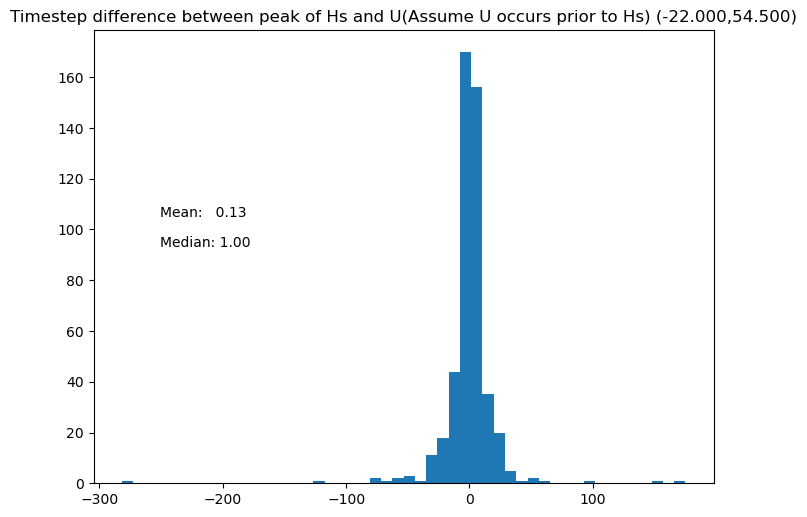

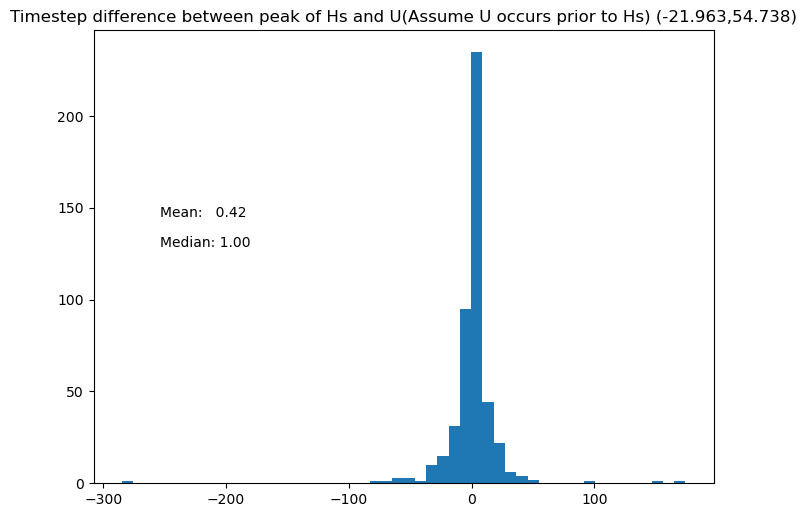

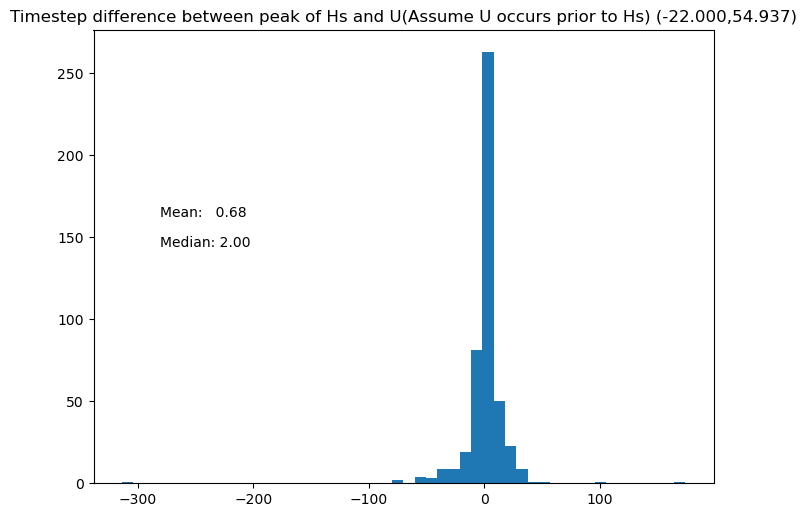

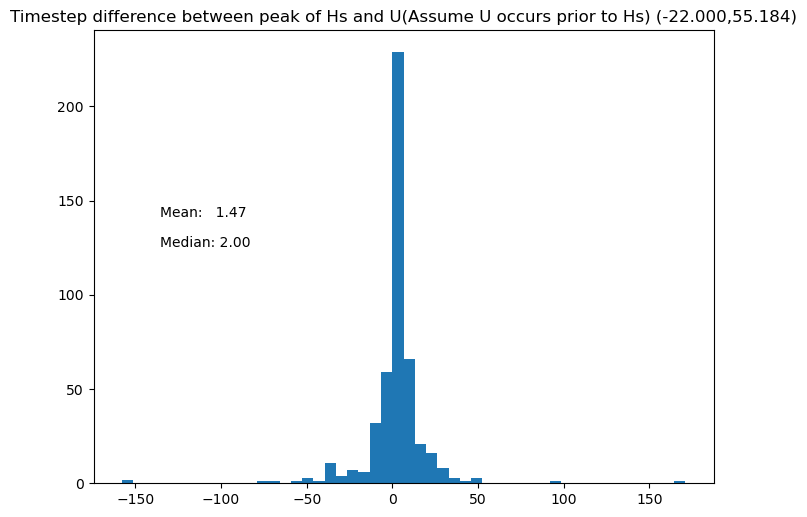

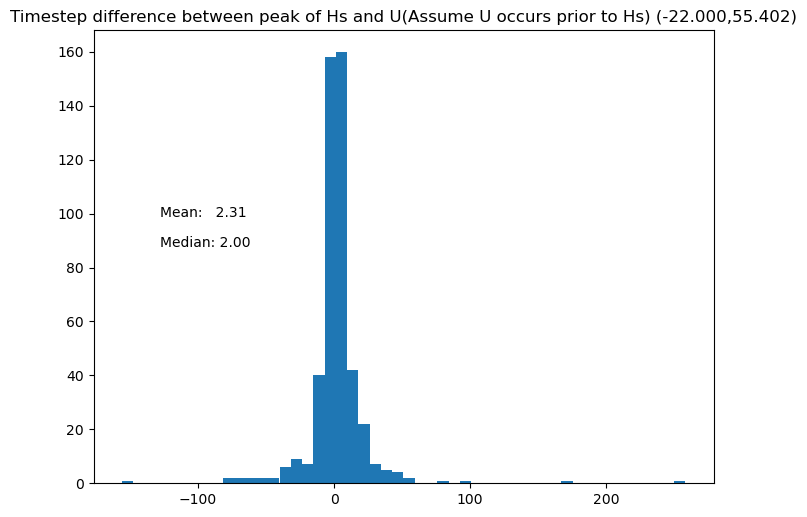

...

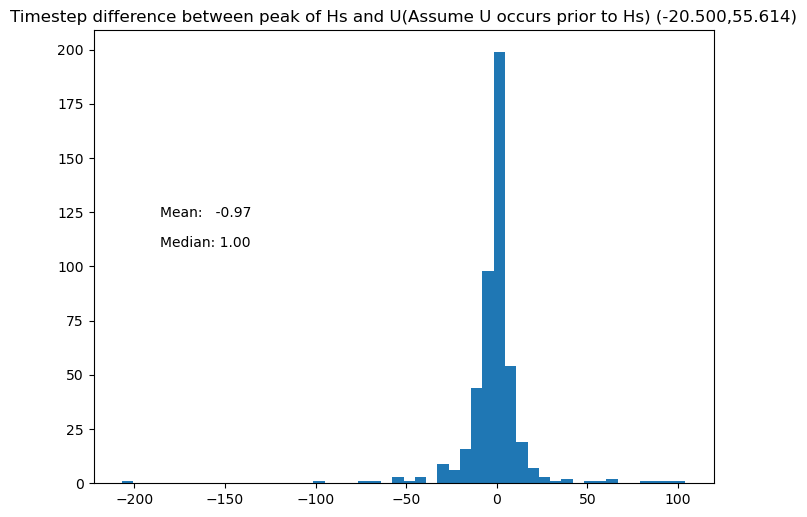

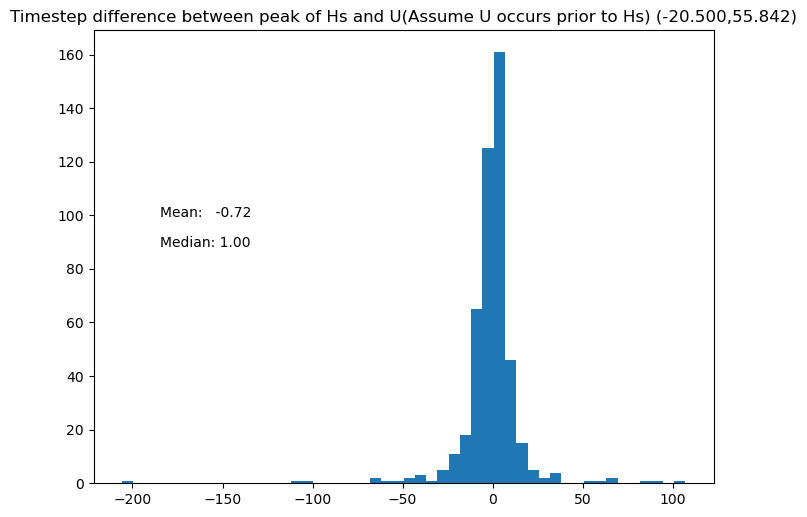

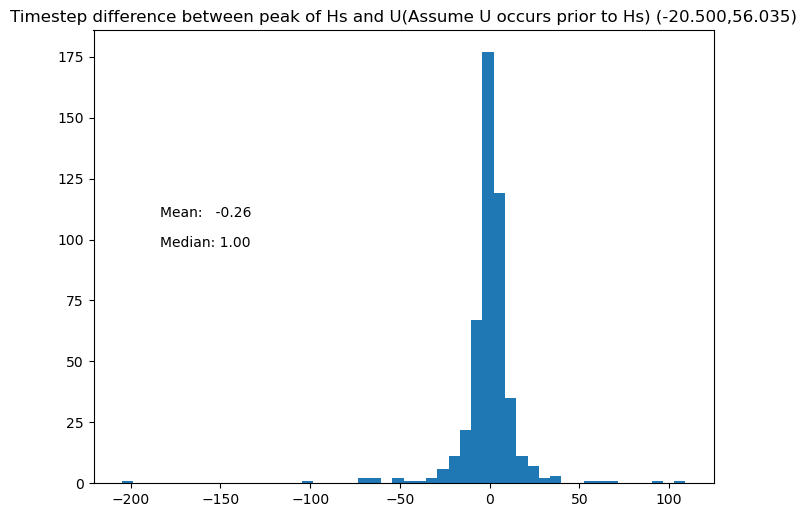

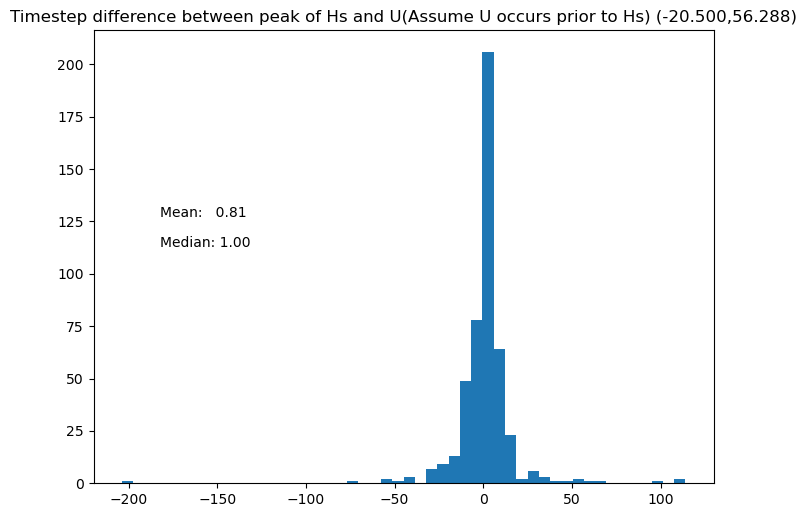

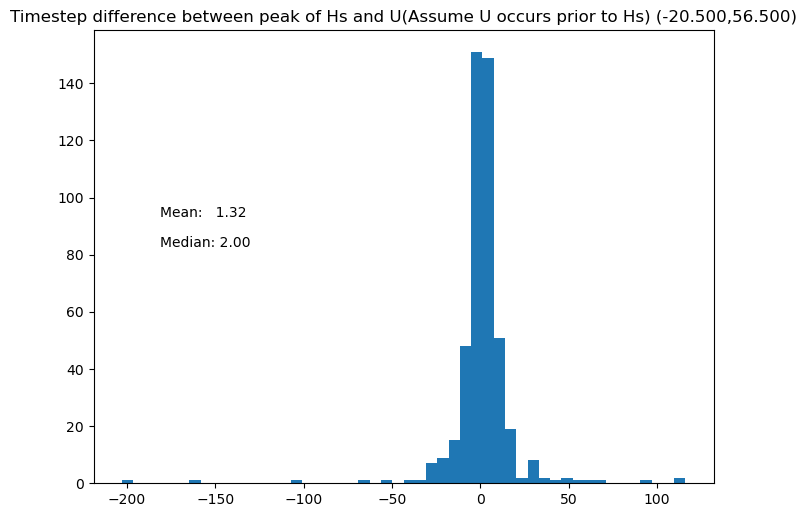

In [33]:
means = []
medians = []
for pos in pos_list:
  _idx = [[],[]]

  for vi in range(num_vars):
    for ei in range(num_events):
      _arg = exp[ei][vi,:,pos].argmax()
      _idx[vi].append(_arg)

  _idx_diff = []
  for ei in range(num_events):
    _idx_diff.append(_idx[0][ei]-_idx[1][ei])
  _idx_diff = np.array(_idx_diff)
  print(np.mean(_idx_diff))
  print(np.median(_idx_diff))
  means.append(np.mean(_idx_diff))
  medians.append(np.median(_idx_diff))

  fig,ax=plt.subplots(figsize=(8,6),dpi=100,facecolor='white')
  ax.set_title(f'Timestep difference between peak of Hs and U(Assume U occurs prior to Hs) ({latlon[pos,0]:.3f},{latlon[pos,1]:.3f})')
  ax.annotate(f'Mean:   {np.mean(_idx_diff):.2f}',[0.2,0.5],xycoords='figure fraction')
  ax.annotate(f'Median: {np.median(_idx_diff):.2f}',[0.2,0.45],xycoords='figure fraction')
  ax.hist(_idx_diff,bins=50)
  plt.savefig(f"./output/exposure_test/({latlon[pos,0]:.3f},{latlon[pos,1]:.3f}_Pos{pos}_peak_diff.png", bbox_inches="tight")



(array([ 2.,  5., 28., 49.,  9.,  4.,  0.,  0.,  1.,  2.]),
 array([-7.78825996, -5.45031447, -3.11236897, -0.77442348,  1.56352201,
         3.90146751,  6.239413  ,  8.57735849, 10.91530398, 13.25324948,
        15.59119497]),
 <BarContainer object of 10 artists>)

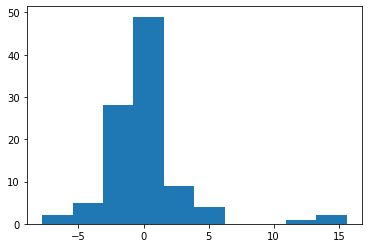

In [36]:
plt.hist(means)

FileNotFoundError: [Errno 2] No such file or directory: './output/exposure_test/(-22.000,54.500_Pos3.png'

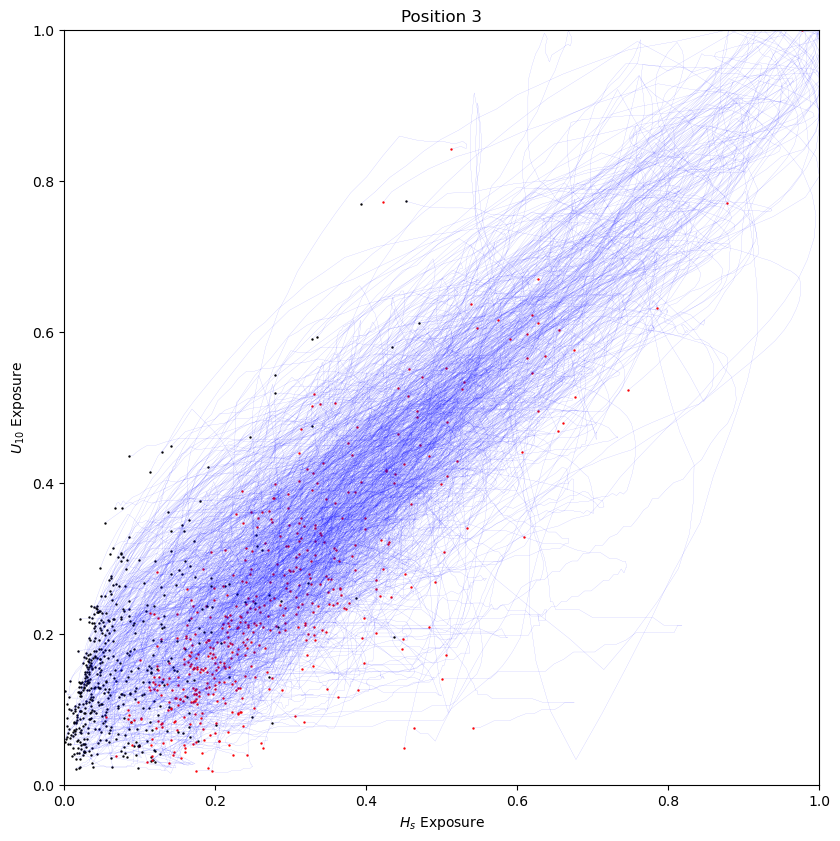

In [10]:
for pos in pos_list:
  fig,ax=plt.subplots(figsize=(10,10),dpi=100,facecolor='white')
  for i in range(num_events):
    ax.plot(exp[i][0,:,pos], exp[i][1,:,pos], color = 'blue', lw=0.1, alpha=0.5)
    ax.scatter(exp[i][0,0,pos], exp[i][1,0,pos], color = 'black',s=0.5)
    ax.scatter(exp[i][0,-1,pos], exp[i][1,-1,pos], color = 'red',s=0.5)
  ax.set_xlim(0,1)
  ax.set_ylim(0,1)
  ax.set_aspect('equal')
  ax.set_xlabel('$H_s$ Exposure')
  ax.set_ylabel('$U_{10}$ Exposure')
  ax.set_title(f'Position {pos}')
  # plt.savefig(f"./output/exposure_test/({latlon[pos,0]:.3f},{latlon[pos,1]:.3f}_Pos{pos}.png", bbox_inches="tight")
  

C:\Users\Kosuke\AppData\Local\Temp/ipykernel_12088/1780247187.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax=plt.subplots(figsize=(10,10),dpi=100,facecolor='white')


KeyboardInterrupt: 

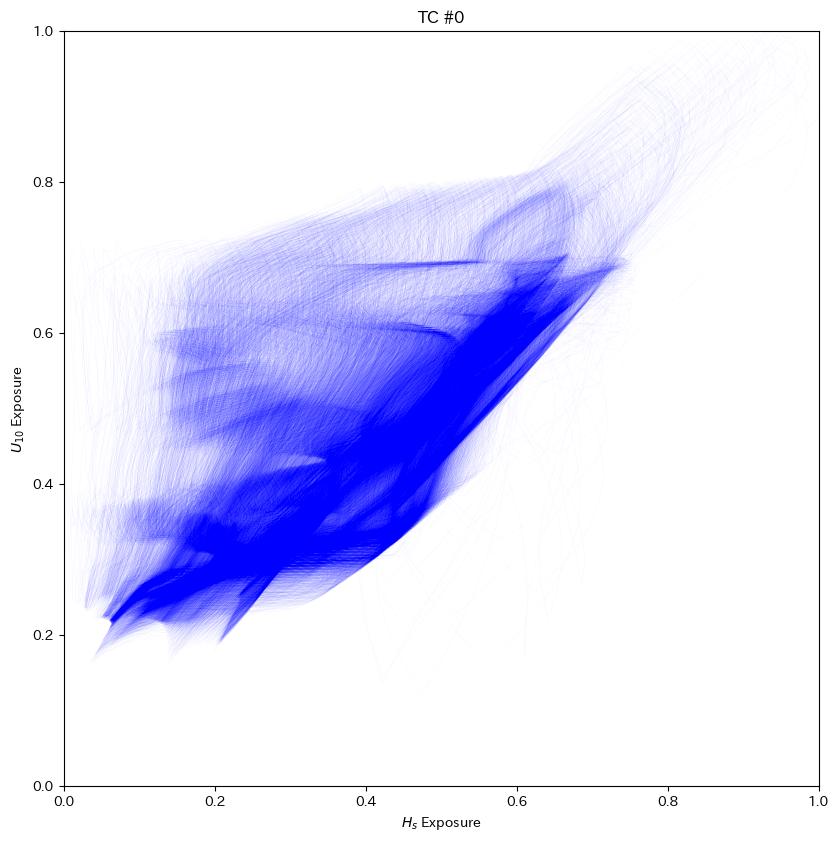

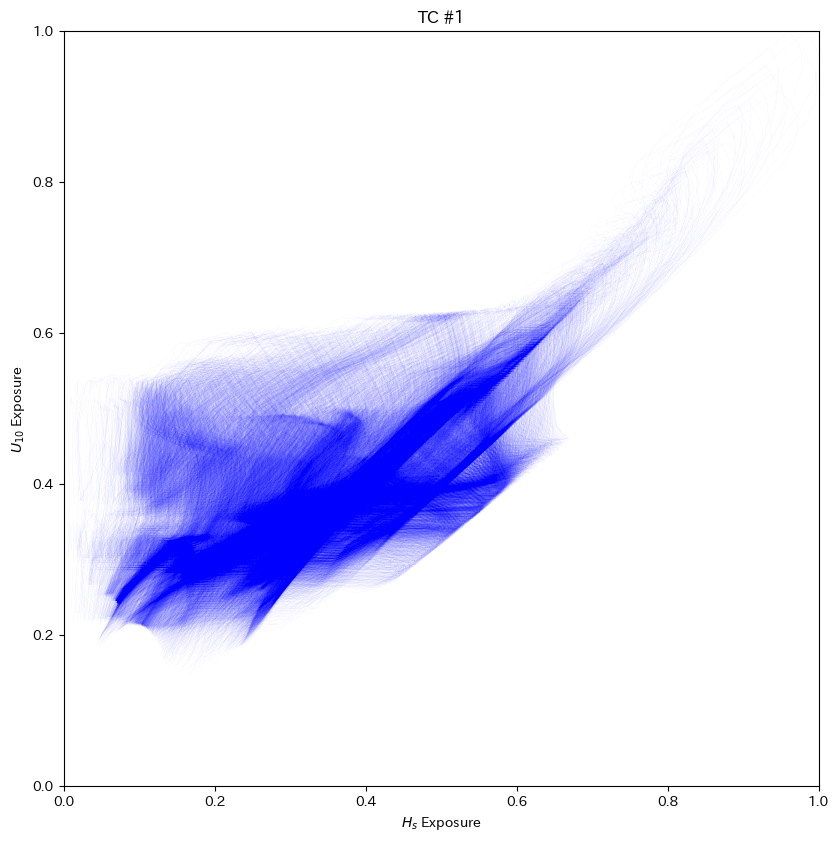

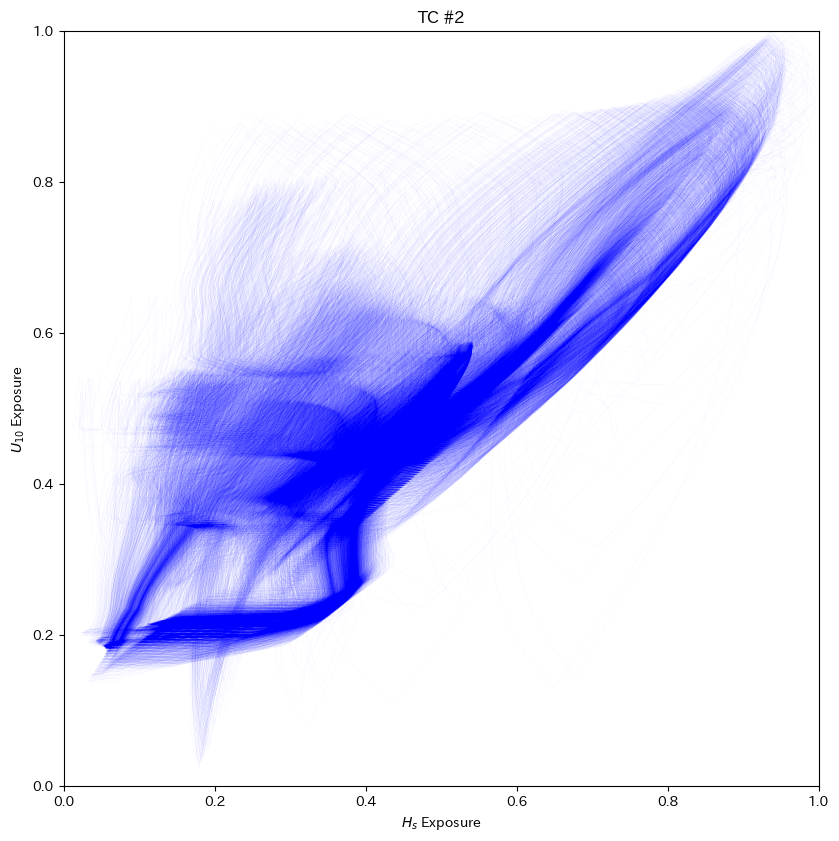

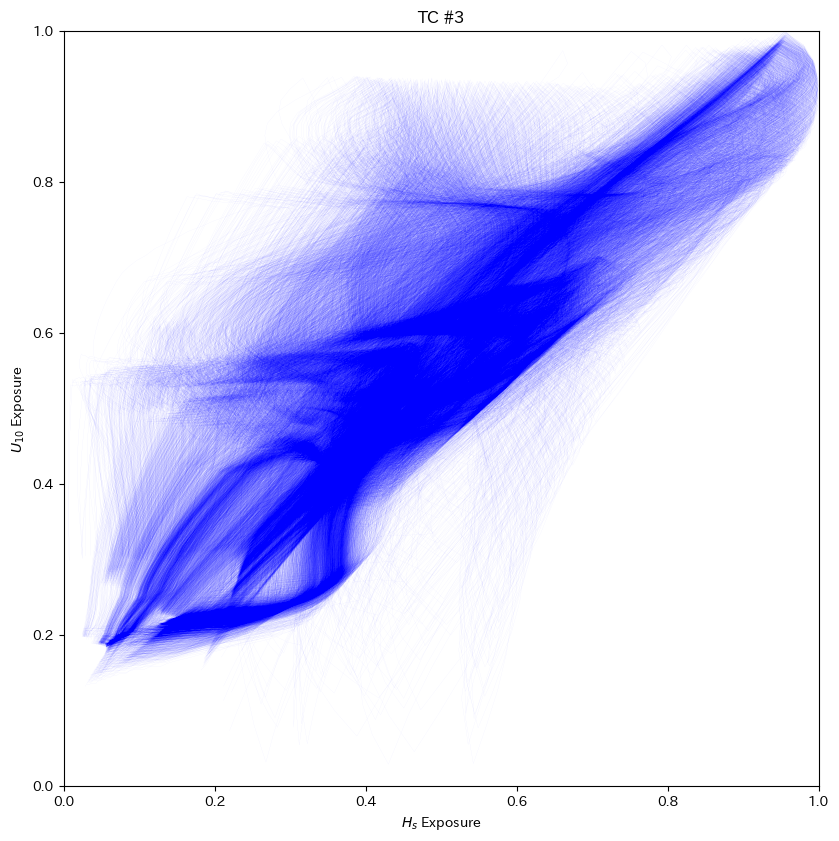

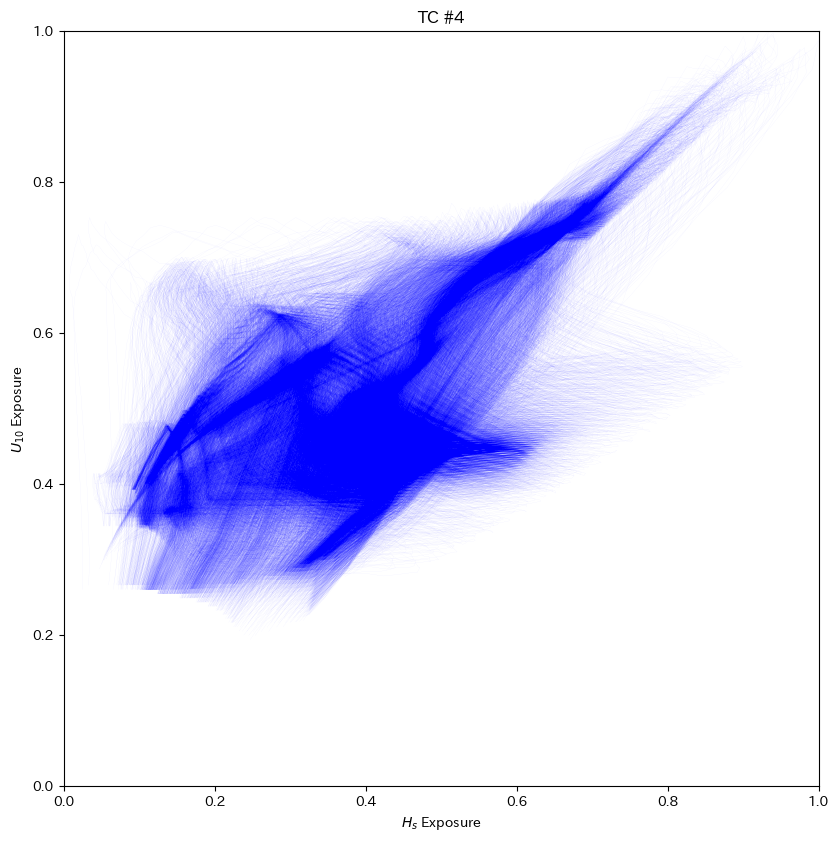

...

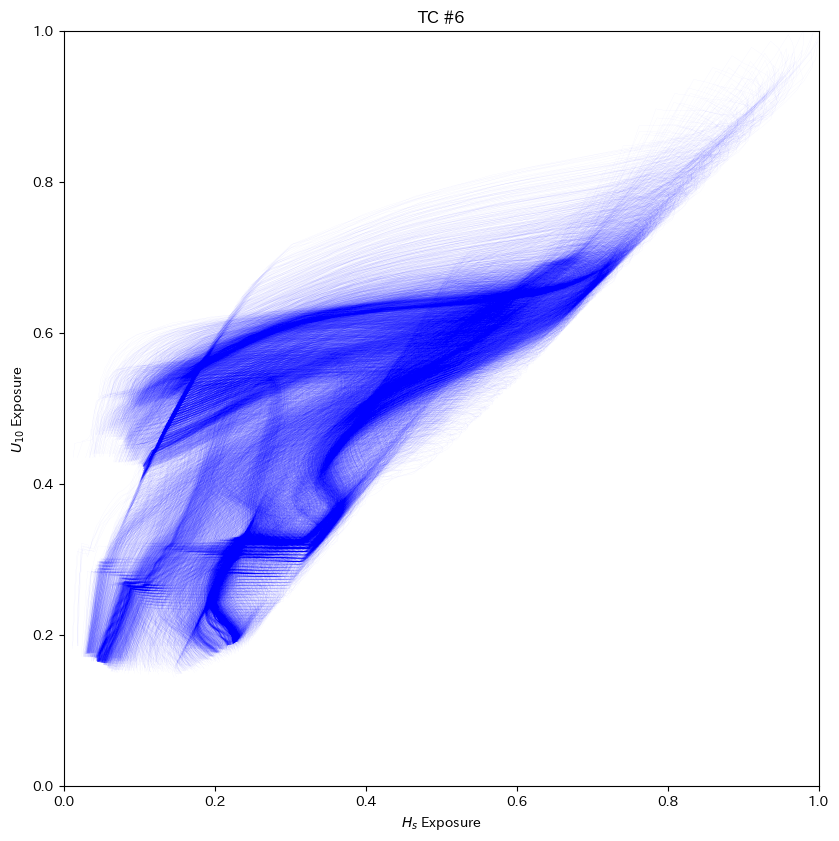

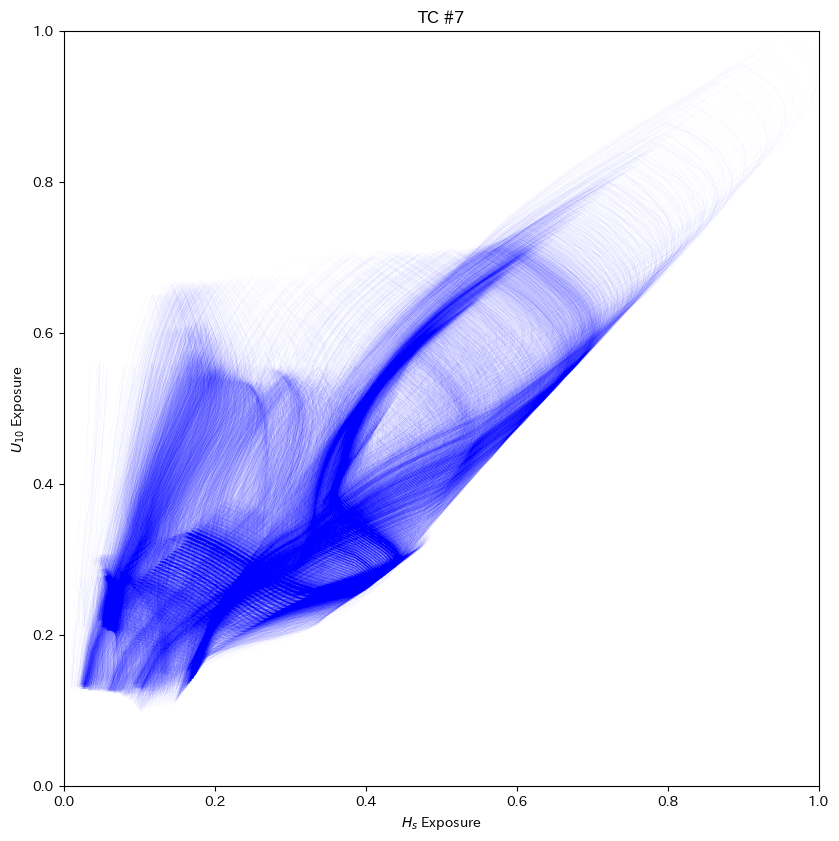

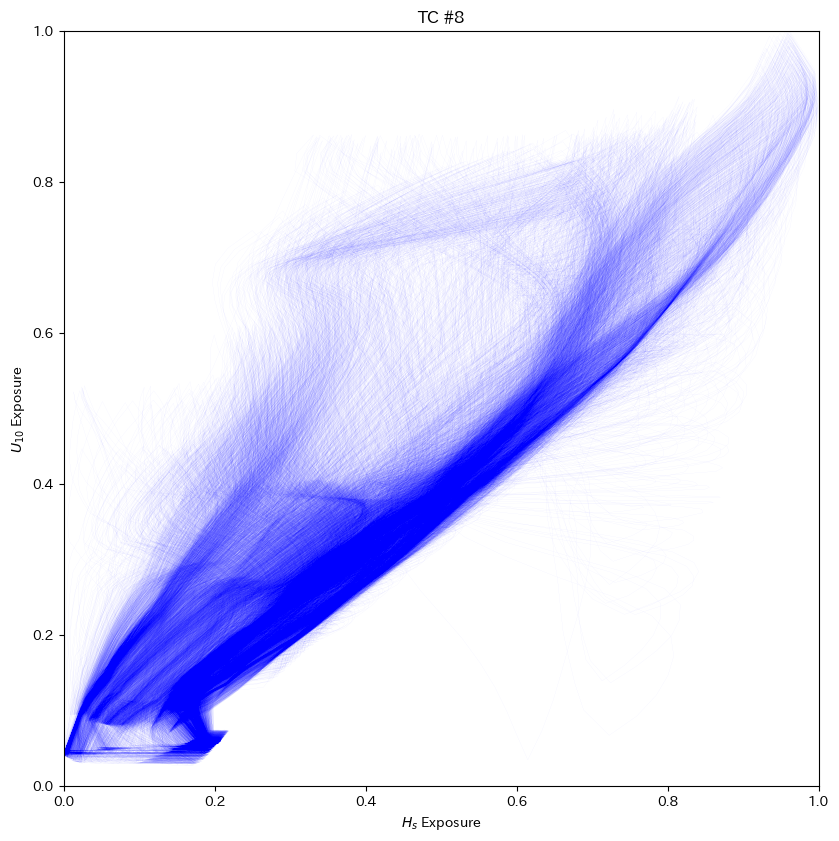

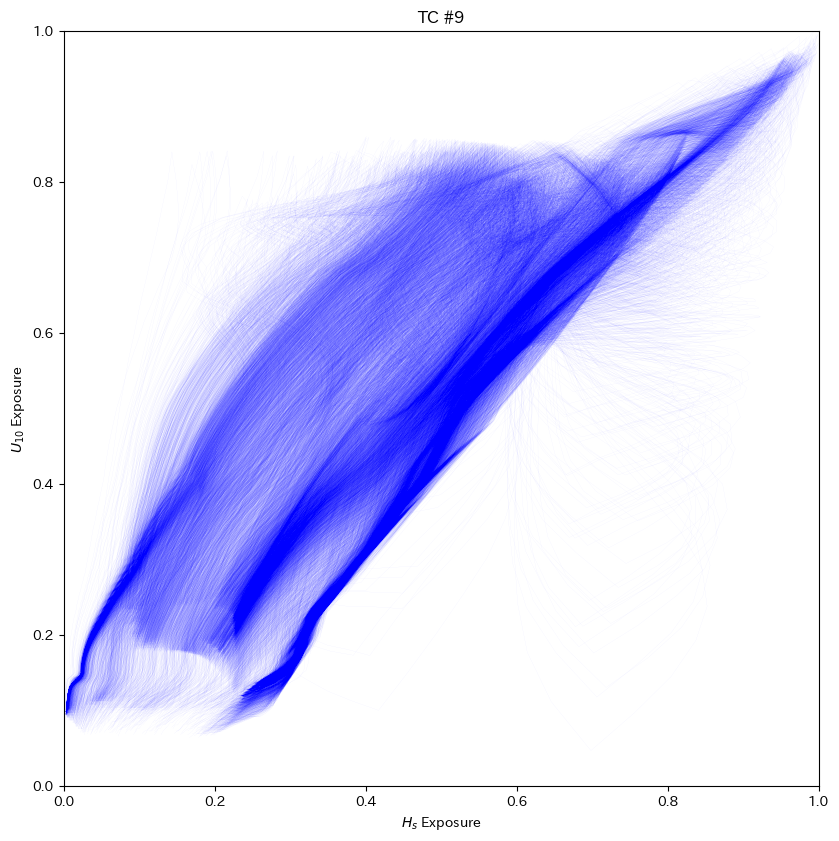

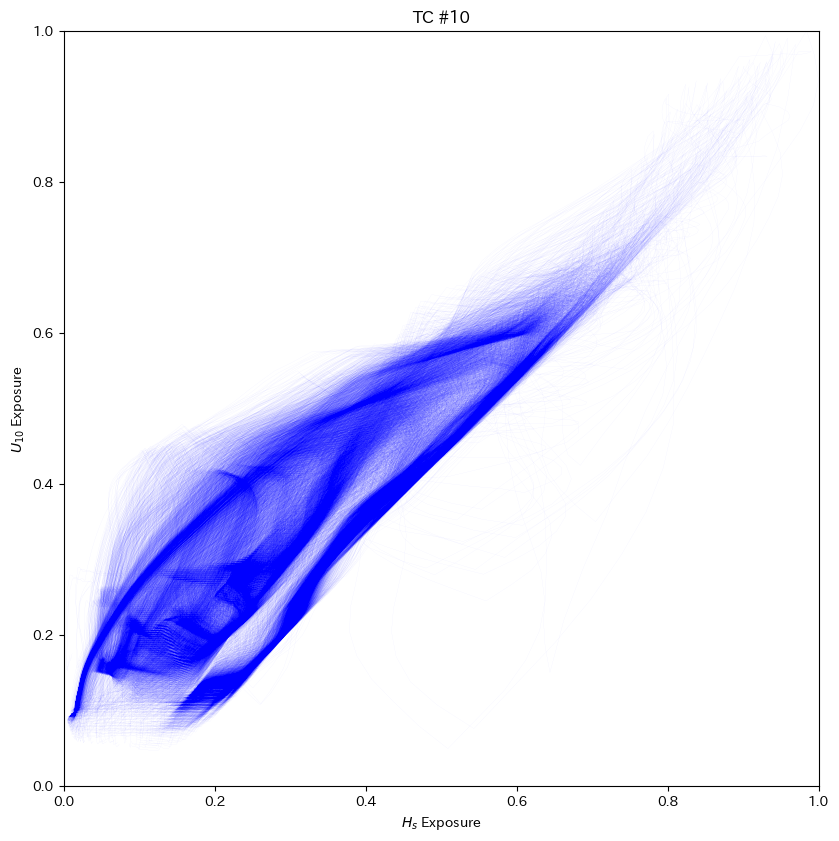

Error in callback <function flush_figures at 0x000001EE5FA13F70> (for post_execute):


KeyboardInterrupt: 

In [ ]:
# ev_num = 1

for ev_num in range(num_events):
  fig,ax=plt.subplots(figsize=(10,10),dpi=100,facecolor='white')
  for pos in range(num_nodes):
    # ax.scatter(exp[i][0,0,pos], exp[i][1,0,pos], color = 'orange')
    ax.plot(exp[ev_num][0,:,pos], exp[ev_num][1,:,pos], color = 'blue', lw=0.1, alpha=0.1)
  ax.set_xlim(0,1)
  ax.set_ylim(0,1)
  ax.set_aspect('equal')
  ax.set_xlabel('$H_s$ Exposure')
  ax.set_ylabel('$U_{10}$ Exposure')
  ax.set_title(f'TC #{ev_num}')
  plt.savefig(f"./output/exposure_test/TC{ev_num}.png", bbox_inches="tight")


In [ ]:
pos = 0
exp_vec = []
for i in range(num_events):
  _num_time = exp[i].shape[1]
  _vec = np.zeros((num_vars,_num_time-1))
  
  for ti in range(_num_time-1):
    _vec[:,ti] = exp[i][:,ti+1,pos]-exp[i][:,ti,pos]
  exp_vec.append(_vec)

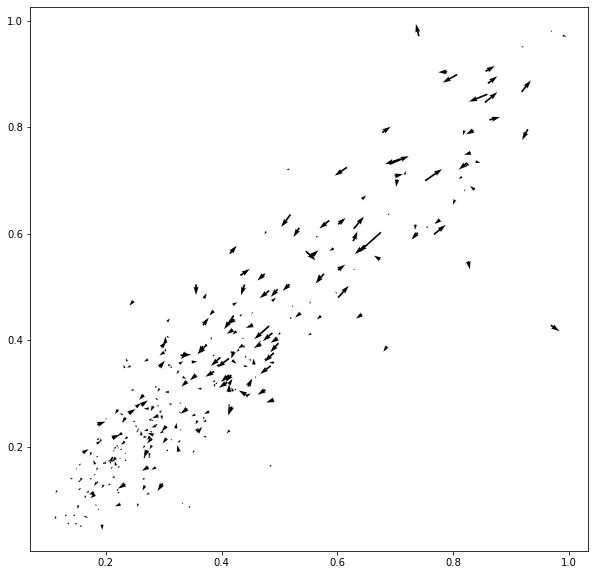

In [ ]:
fig,ax=plt.subplots(figsize=(10,10), facecolor='white')
t = 100
duration = []
for i in range(num_events):
  duration.append(exp[i].shape[1])
  if exp[i].shape[1] > t+1:
    ax.quiver(exp[i][0,t,pos], 
              exp[i][1,t,pos],
              exp_vec[i][0,t],
              exp_vec[i][1,t],
              scale=1,
              width=0.003, 
              headwidth=3,
              alpha=1)

(array([ 43., 195., 127.,  72.,  24.,   8.,   2.,   2.,   1.,   3.]),
 array([ 11. ,  65.7, 120.4, 175.1, 229.8, 284.5, 339.2, 393.9, 448.6,
        503.3, 558. ]),
 <BarContainer object of 10 artists>)

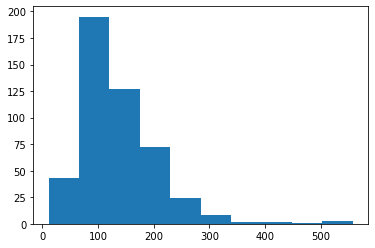

In [ ]:
plt.hist(duration)

In [ ]:
vec_len = []
for i in range(num_events):
  _len = np.sqrt(exp_vec[i][0,:]**2 + exp_vec[i][1,:]**2)
  vec_len.extend(_len.tolist())

(array([2.3770e+04, 1.9403e+04, 1.0194e+04, 5.2190e+03, 2.6570e+03,
        1.4300e+03, 8.0100e+02, 5.0900e+02, 3.0900e+02, 1.5600e+02,
        1.1300e+02, 6.4000e+01, 4.3000e+01, 1.0000e+01, 2.0000e+01,
        7.0000e+00, 3.0000e+00, 3.0000e+00, 1.0000e+00, 0.0000e+00,
        1.0000e+00, 0.0000e+00, 1.0000e+00, 1.0000e+00, 1.0000e+00,
        2.0000e+00, 1.0000e+00, 1.0000e+00, 0.0000e+00, 1.0000e+00,
        0.0000e+00, 1.0000e+00, 1.0000e+00, 1.0000e+00, 1.0000e+00,
        1.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00,
        1.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 1.0000e+00]),
 array([0.        , 0.00577153, 0.01154306, 0.01731458, 0.02308611,
        0.02885764, 0.03462917, 0.04040069, 0.04617222, 0.05194375,
        0.05771528, 0.0634868 , 0.06925833, 0.07502986, 0.08080139,
        0.08657292, 0.09234444, 0.09811597, 0.1038875 , 0.10965903,
        0.11543055, 0.12120208, 0.12697361, 0.

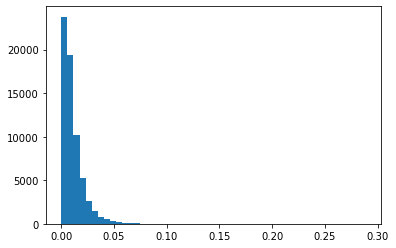

In [ ]:
plt.hist(vec_len,bins=50)

In [ ]:
_a = np.array([1,2,3])
_b = np.array([1,2,3])
np.sqrt(_a**2 +_b**2)

array([1.41421356, 2.82842712, 4.24264069])